In [ ]:
from spyglass_hexmaze.hex_maze_behavior import HexMazeBlock, HexCentroids
from spyglass_hexmaze.hex_maze_decoding import DecodedPositionDistance
from hexmaze import plot_hex_maze, resolve_port

import spyglass.common as sgc
import matplotlib.pyplot as plt
import numpy as np

restriction = "nwb_file_name LIKE '%IM-%'"
decode_keys = (DecodedPositionDistance() & restriction).fetch("KEY", order_by="nwb_file_name")
block_keys = (HexMazeBlock() & decode_keys).fetch("KEY", order_by="nwb_file_name, epoch")

display(DecodedPositionDistance() & decode_keys)
display(HexMazeBlock() & block_keys)

decoding_merge_id,nwb_file_name name of the NWB file,analysis_file_name name of the file,decoded_distance_object_id
14fc3ff2-c6c4-3802-7faf-a92ca5f0dbaf,IM-1478_20220719_.nwb,IM-1478_20220719_LJF2F3MWDX.nwb,6d8a8f50-b8aa-4ce9-bef4-5297fd3cb7ab
3bc86da6-6dfb-cdb2-4447-5a05ece3718b,IM-1478_20220724_.nwb,IM-1478_20220724_CEUI97QV6C.nwb,ea4ea015-635c-4240-b232-4f3ca8993702
5b8a121f-5e12-c8a3-95dc-e48d3bb97295,IM-1478_20220720_.nwb,IM-1478_20220720_3R46S0KBBQ.nwb,227f4a93-c1e5-40ed-83e7-b89fe9774a88
c6932302-5f74-dc1c-4e86-b1c3604817c3,IM-1478_20220725_.nwb,IM-1478_20220725_NFHM57J8AM.nwb,e3ad8388-3cba-4b58-ba8c-c16d60550b47
cfcfc908-e5ce-18b5-d043-a43471d9ef53,IM-1478_20220726_.nwb,IM-1478_20220726_ARGIXN29O8.nwb,c73820b6-6266-45aa-ac34-9fb8e88bfc33
f7db35cd-a965-54e9-332b-97519e4a38ed,IM-1478_20220727_.nwb,IM-1478_20220727_5CXCGYK32V.nwb,eae6c598-41c9-491b-b439-8608ba539c89


nwb_file_name name of the NWB file,epoch the session epoch for this task and apparatus(1 based),block the block number within the epoch,config_id maze configuration as a string,interval_list_name descriptive name of this interval list,p_a probability of reward at port A,p_b probability of reward at port B,p_c probability of reward at port C,num_trials number of trials in this block,task_type 'barrier shift' or 'probabilty shift'
IM-1478_20220719_.nwb,0,1,"8,9,16,18,23,27,35,42,44",epoch0_block1,90.0,10.0,50.0,65,barrier change
IM-1478_20220719_.nwb,0,2,"8,9,18,21,23,27,35,42,44",epoch0_block2,90.0,10.0,50.0,62,barrier change
IM-1478_20220719_.nwb,0,3,"8,9,18,21,23,24,27,42,44",epoch0_block3,90.0,10.0,50.0,58,barrier change
IM-1478_20220720_.nwb,0,1,"10,14,15,25,26,30,34,39,46",epoch0_block1,10.0,50.0,90.0,69,probability change
IM-1478_20220720_.nwb,0,2,"10,14,15,25,26,30,34,39,46",epoch0_block2,90.0,10.0,50.0,51,probability change
IM-1478_20220724_.nwb,0,1,"11,14,15,16,28,30,32,34,45",epoch0_block1,50.0,90.0,10.0,64,probability change
IM-1478_20220724_.nwb,0,2,"11,14,15,16,28,30,32,34,45",epoch0_block2,90.0,10.0,50.0,46,probability change
IM-1478_20220725_.nwb,0,1,"11,12,14,15,22,29,31,35,45",epoch0_block1,10.0,50.0,90.0,68,barrier change
IM-1478_20220725_.nwb,0,2,"11,12,14,15,20,22,29,31,45",epoch0_block2,10.0,50.0,90.0,66,barrier change
IM-1478_20220725_.nwb,0,3,"11,12,14,15,20,29,31,36,45",epoch0_block3,10.0,50.0,90.0,54,barrier change


In [ ]:
# Function to plot port choices
PORT_COLORS = {"A": "#1a3a8c", "B": "#3aa65a", "C": "#f5a623",
               1: "#1a3a8c", 2: "#3aa65a", 3:"#f5a623"}
 
def plot_port_choices(ports, rewards, block_breaks=[]):
    n_trials = len(ports)
    cell = 0.15 # inches per grid cell
    fig, ax = plt.subplots(figsize=(n_trials * cell, 24 * cell))

    # Plot circles for each port visit 
    for i, (port, reward) in enumerate(zip(ports, rewards), start=1):
        color = PORT_COLORS[port]
        y = 4-resolve_port(port)
        if reward:
            ax.scatter(i, y, color=color, s=80, zorder=2, linewidths=0)
        else:
            ax.scatter(i, y, facecolors="white", edgecolors=color, s=80, linewidths=1.4, zorder=2)

    # Plot lines for block changes
    for b in block_breaks:
        ax.axvline(b + 0.5, color="red", linewidth=1.0, zorder=3)
        ax.scatter(b + 0.5, 3.8, marker="v", color="red", s=60, zorder=4, clip_on=False)
 
    # Grid (minor ticks at cell edges so dots sit centered)
    ax.set_xticks(range(1, n_trials + 1))
    ax.set_yticks([1, 2, 3])
    ax.set_xticklabels(range(1, n_trials + 1), fontsize=9)
    ax.set_yticklabels(["A", "B", "C"], fontsize=9)
    ax.set_xticks(np.arange(0.5, n_trials + 1.5), minor=True)
    ax.set_yticks([0.5, 1.5, 2.5, 3.5], minor=True)
    ax.set_xlim(0.5, n_trials + 0.5)
    ax.set_ylim(0.5, 3.5)
    ax.set_aspect("equal")
    ax.grid(True, which="minor", linestyle="-", linewidth=0.4, color="#cccccc", zorder=0)
    ax.tick_params(which="minor", length=0)
    ax.set_axisbelow(True)
 
    # Show every 10th trial num
    for i, label in enumerate(ax.xaxis.get_ticklabels()):
        label.set_visible((i + 1) % 10 == 0)
    ax.set_xlabel("Trial number", fontsize=10)
    ax.set_ylabel("Port", fontsize=10)
    ax.spines[["top", "right"]].set_visible(False)

    return fig, ax

{'nwb_file_name': 'IM-1478_20220727_.nwb', 'epoch': 0, 'block': 1}: barrier change session for the hex maze task with 4 blocks and 225 trials.


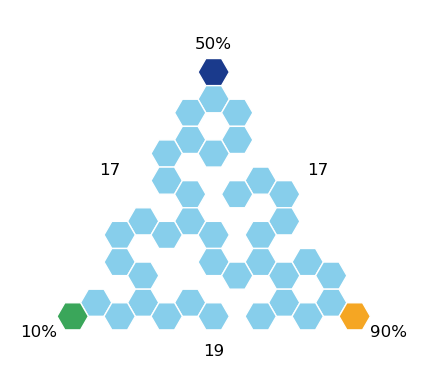

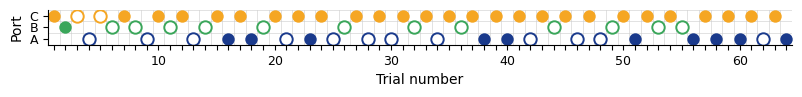

{'nwb_file_name': 'IM-1478_20220727_.nwb', 'epoch': 0, 'block': 2}: barrier change session for the hex maze task with 4 blocks and 225 trials.


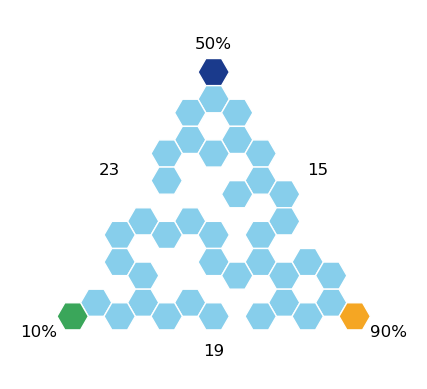

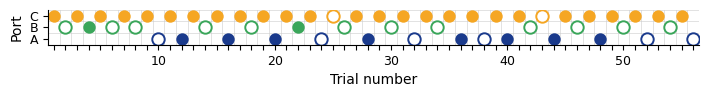

{'nwb_file_name': 'IM-1478_20220727_.nwb', 'epoch': 0, 'block': 3}: barrier change session for the hex maze task with 4 blocks and 225 trials.


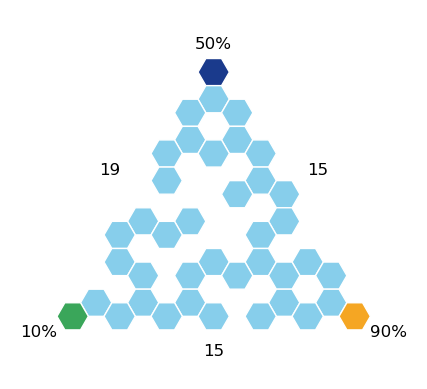

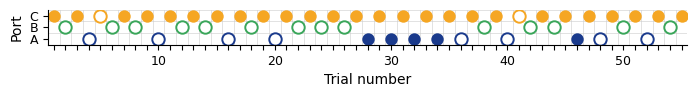

{'nwb_file_name': 'IM-1478_20220727_.nwb', 'epoch': 0, 'block': 4}: barrier change session for the hex maze task with 4 blocks and 225 trials.


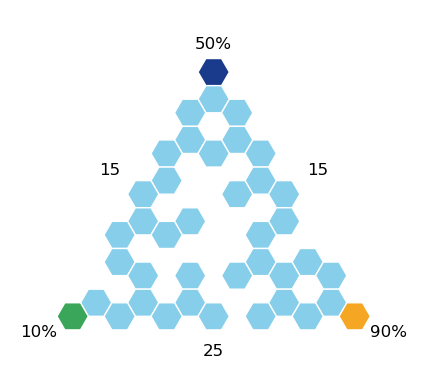

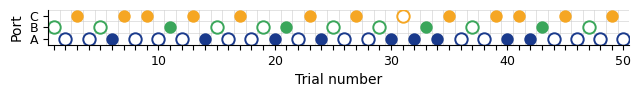

In [13]:
# Re-fetch even though we have block_keys so we can order them
for key in (HexMazeBlock() & block_keys).fetch("KEY", order_by="nwb_file_name, epoch, block"):
    # Get block info
    print(f"{key}: {(sgc.Session() & key).fetch('session_description')[0]}")
    block = HexMazeBlock() & key
    trials = HexMazeBlock.Trial() & key
    # Plot maze
    maze = block.fetch("config_id")[0]
    reward_probs = [int(block.fetch("p_a")[0]), int(block.fetch("p_b")[0]), int(block.fetch("p_c")[0])]
    plot_hex_maze(maze, show_barriers=False, show_stats=True, show_hex_labels=False, reward_probabilities=reward_probs,
                  highlight_hexes=[{1}, {2}, {3}], highlight_colors=[PORT_COLORS["A"], PORT_COLORS["B"], PORT_COLORS["C"]])
    # Plot trials
    fig, ax = plot_port_choices(trials.fetch("end_port"), trials.fetch("reward"))
    display(fig)
    plt.close(fig)

{'nwb_file_name': 'IM-1478_20220719_.nwb', 'epoch': 0, 'block': 1}: barrier change session for the hex maze task with 3 blocks and 185 trials.


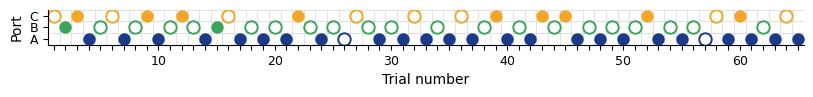

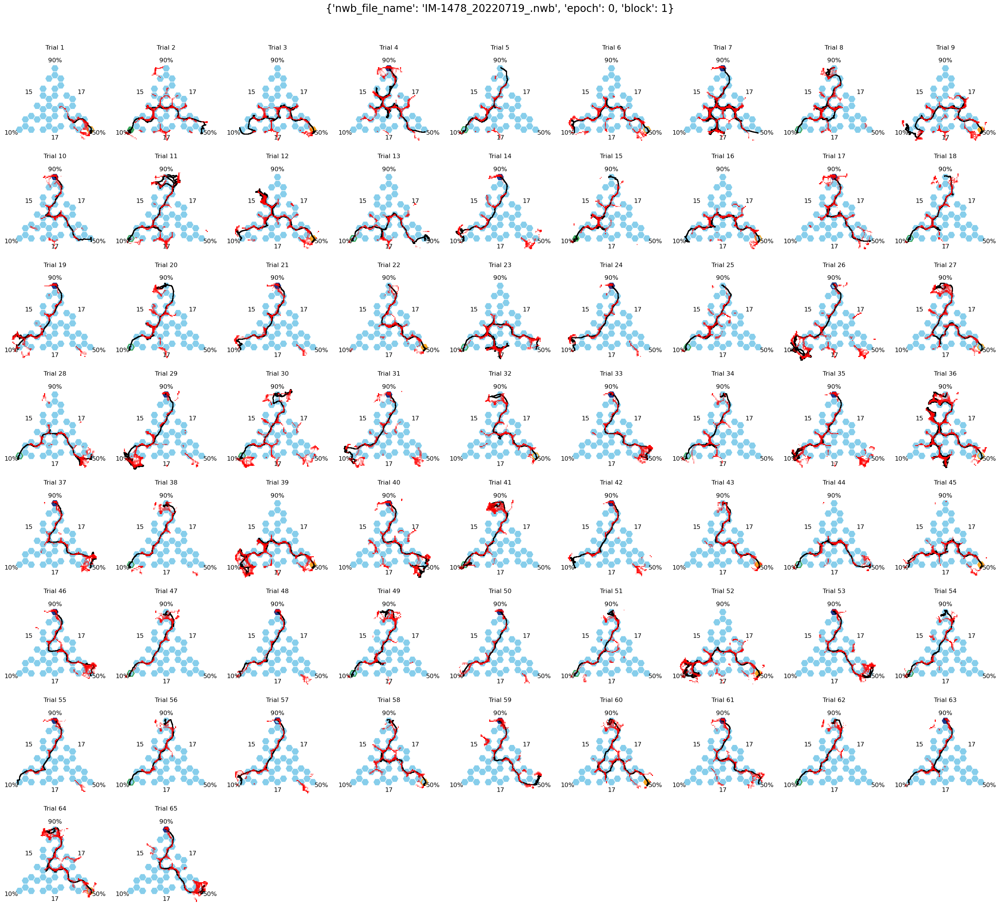

{'nwb_file_name': 'IM-1478_20220719_.nwb', 'epoch': 0, 'block': 2}: barrier change session for the hex maze task with 3 blocks and 185 trials.


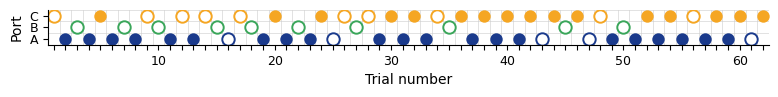

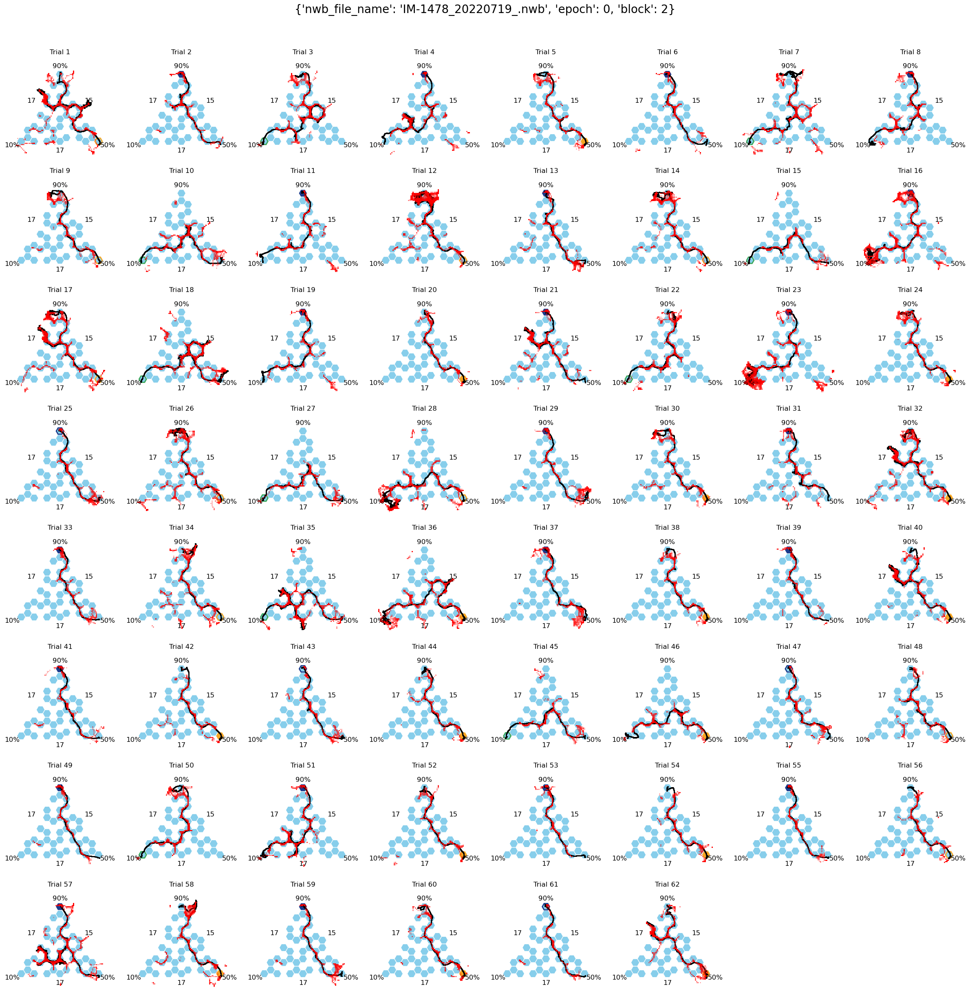

{'nwb_file_name': 'IM-1478_20220719_.nwb', 'epoch': 0, 'block': 3}: barrier change session for the hex maze task with 3 blocks and 185 trials.


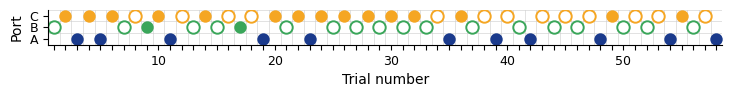

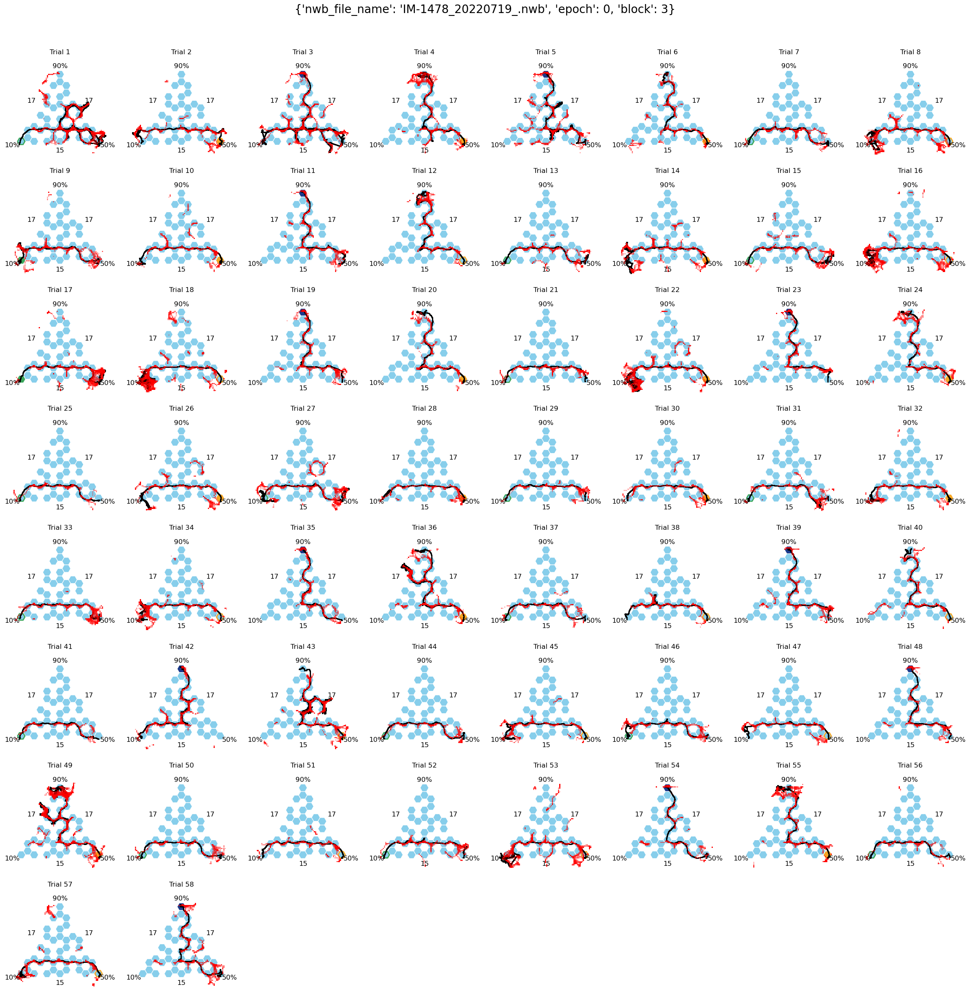

{'nwb_file_name': 'IM-1478_20220720_.nwb', 'epoch': 0, 'block': 1}: probability change session for the hex maze task with 2 blocks and 120 trials.


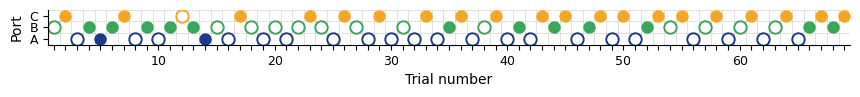

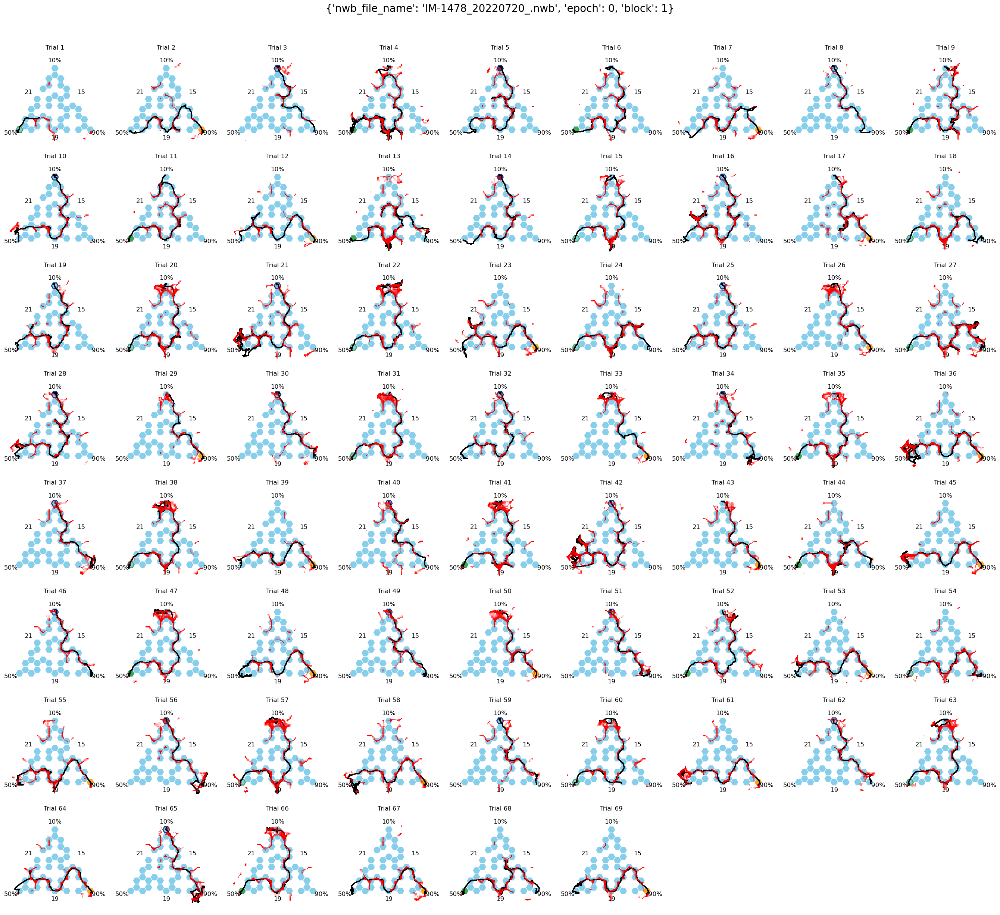

{'nwb_file_name': 'IM-1478_20220720_.nwb', 'epoch': 0, 'block': 2}: probability change session for the hex maze task with 2 blocks and 120 trials.


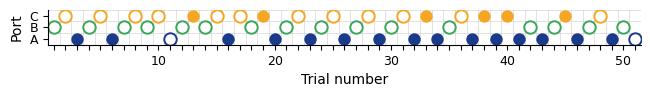

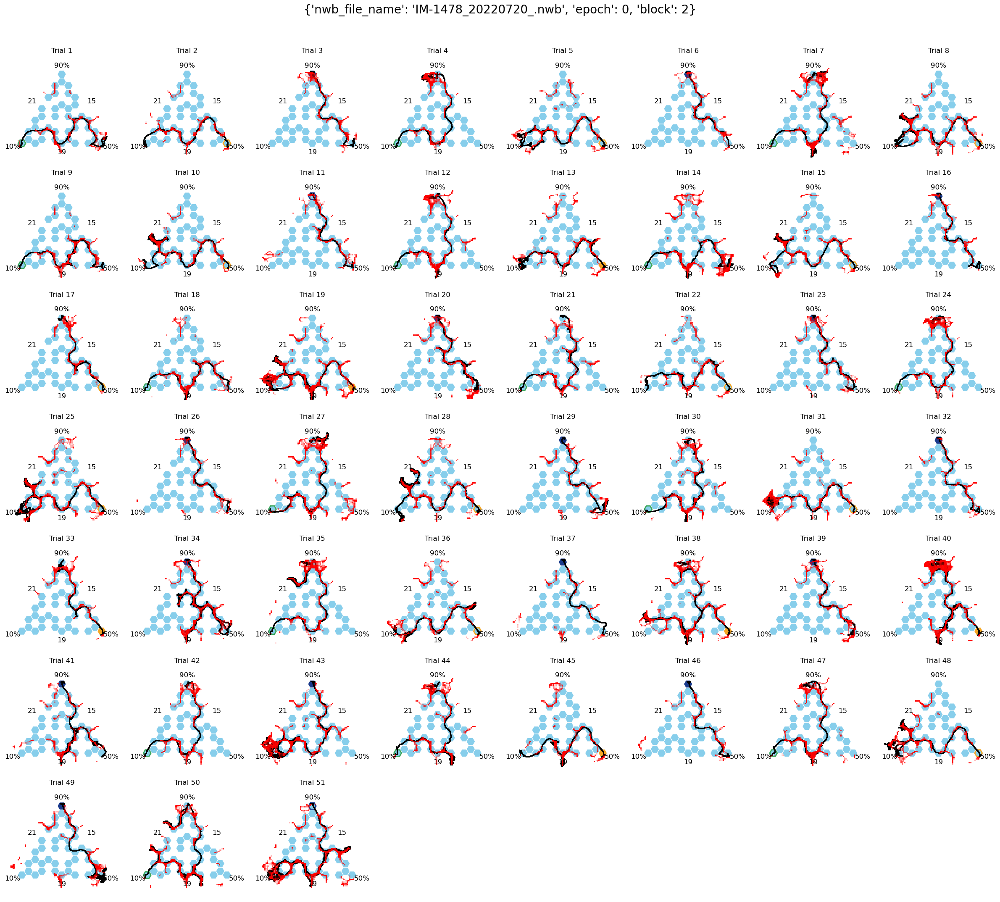

{'nwb_file_name': 'IM-1478_20220724_.nwb', 'epoch': 0, 'block': 1}: probability change session for the hex maze task with 2 blocks and 110 trials.


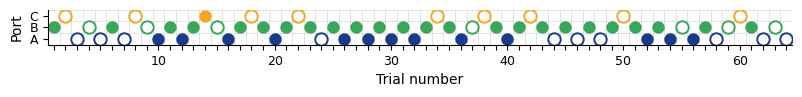

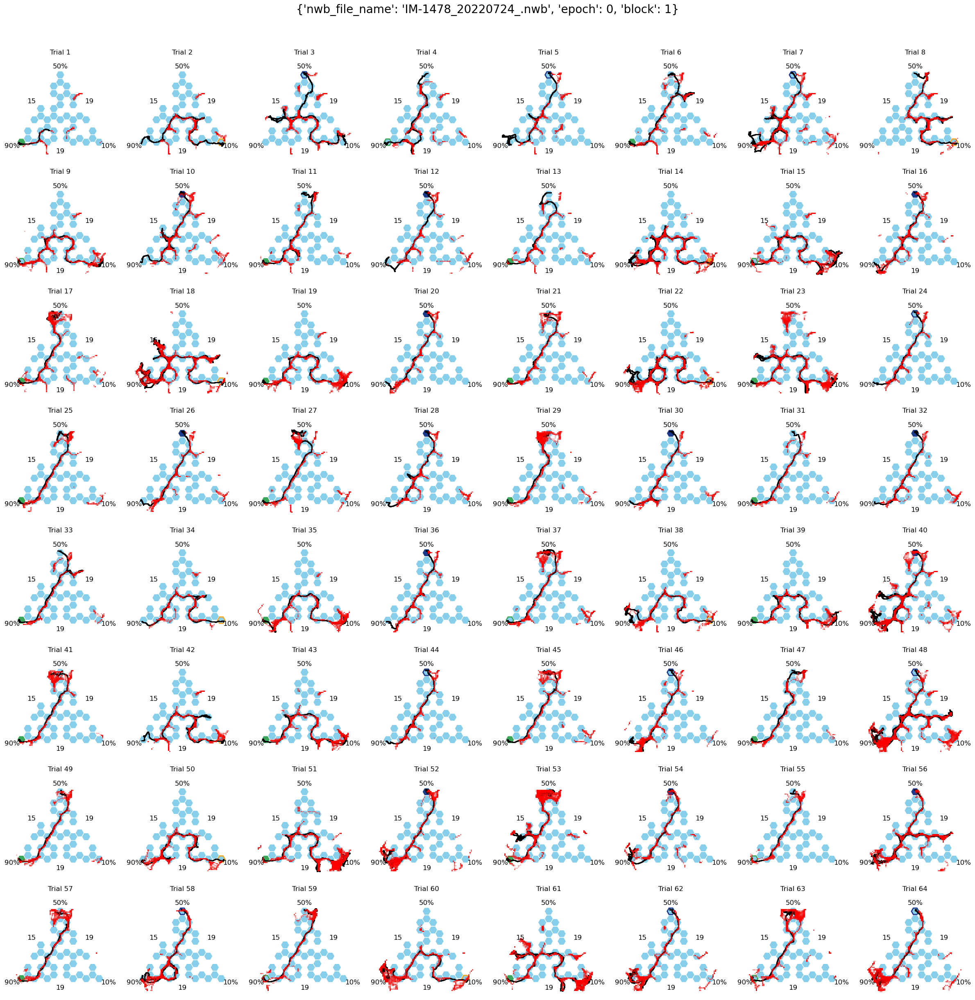

{'nwb_file_name': 'IM-1478_20220724_.nwb', 'epoch': 0, 'block': 2}: probability change session for the hex maze task with 2 blocks and 110 trials.


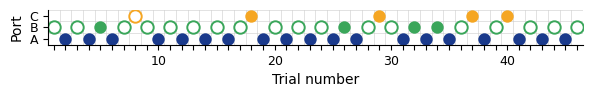

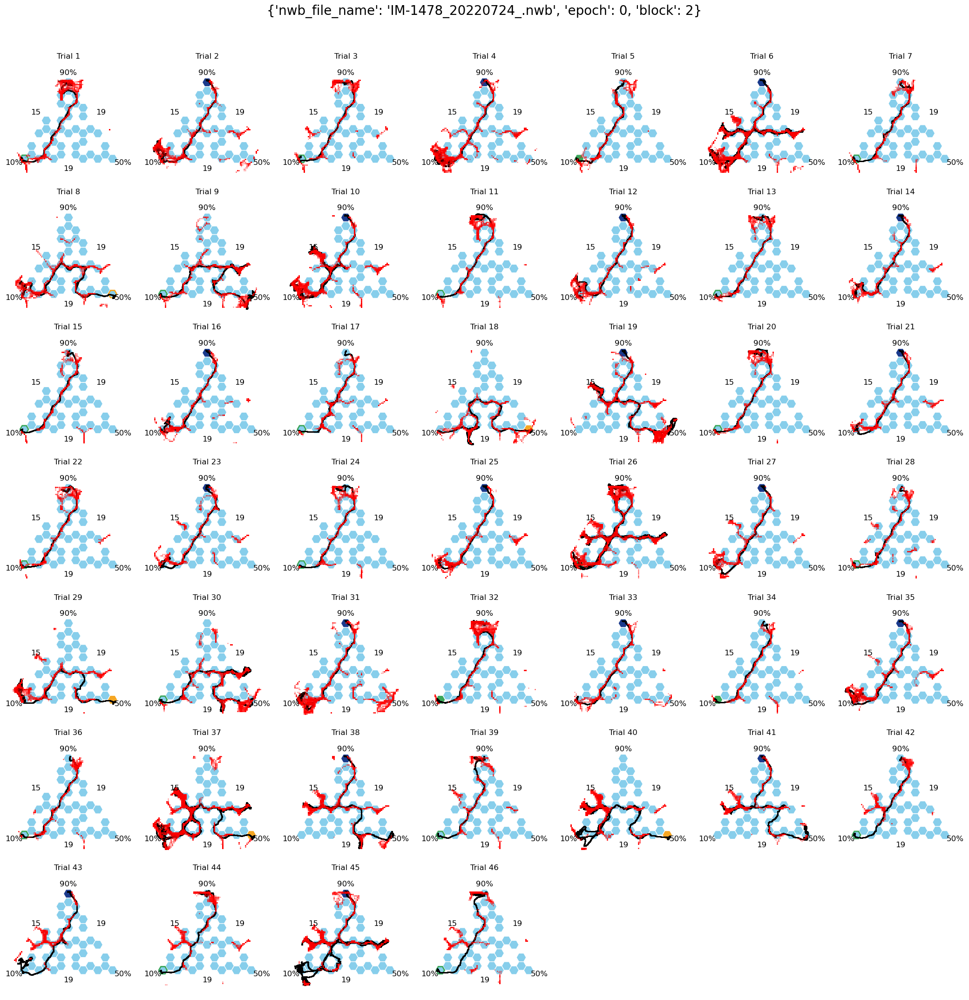

{'nwb_file_name': 'IM-1478_20220725_.nwb', 'epoch': 0, 'block': 1}: barrier change session for the hex maze task with 3 blocks and 188 trials.


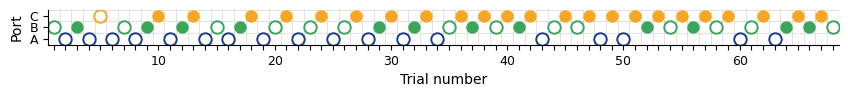

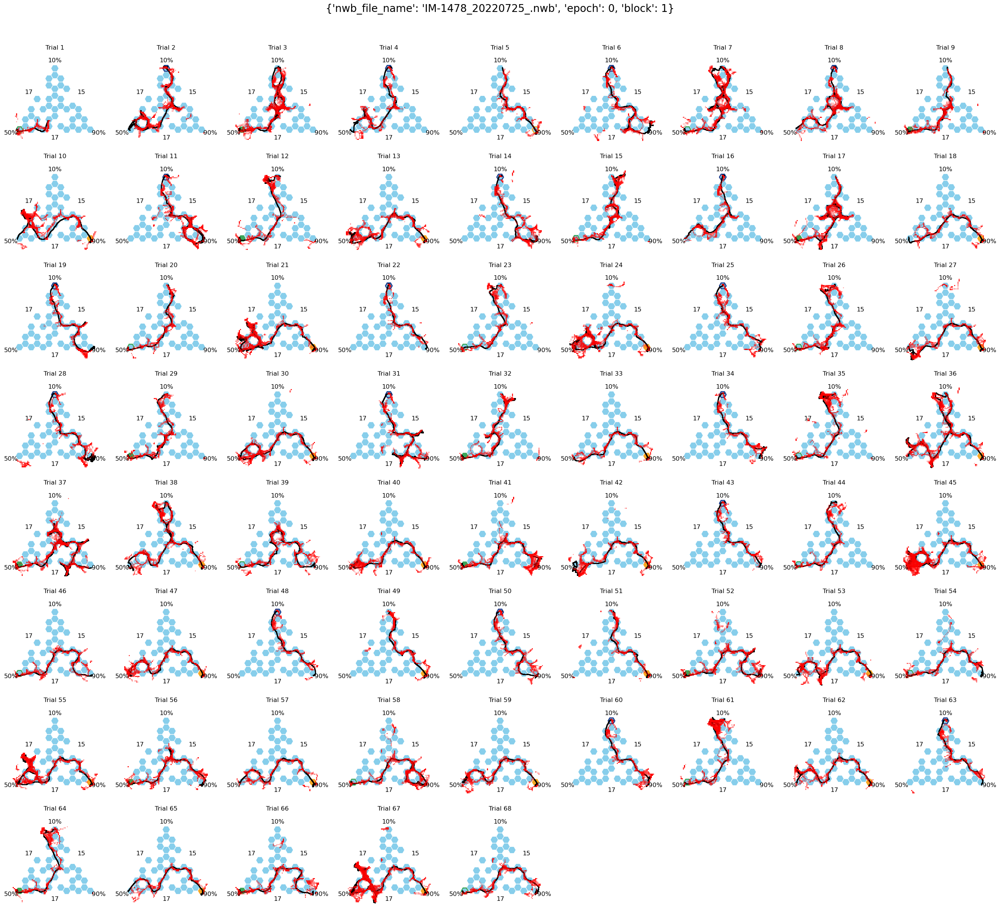

{'nwb_file_name': 'IM-1478_20220725_.nwb', 'epoch': 0, 'block': 2}: barrier change session for the hex maze task with 3 blocks and 188 trials.


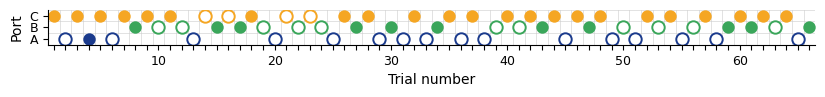

KeyboardInterrupt: 

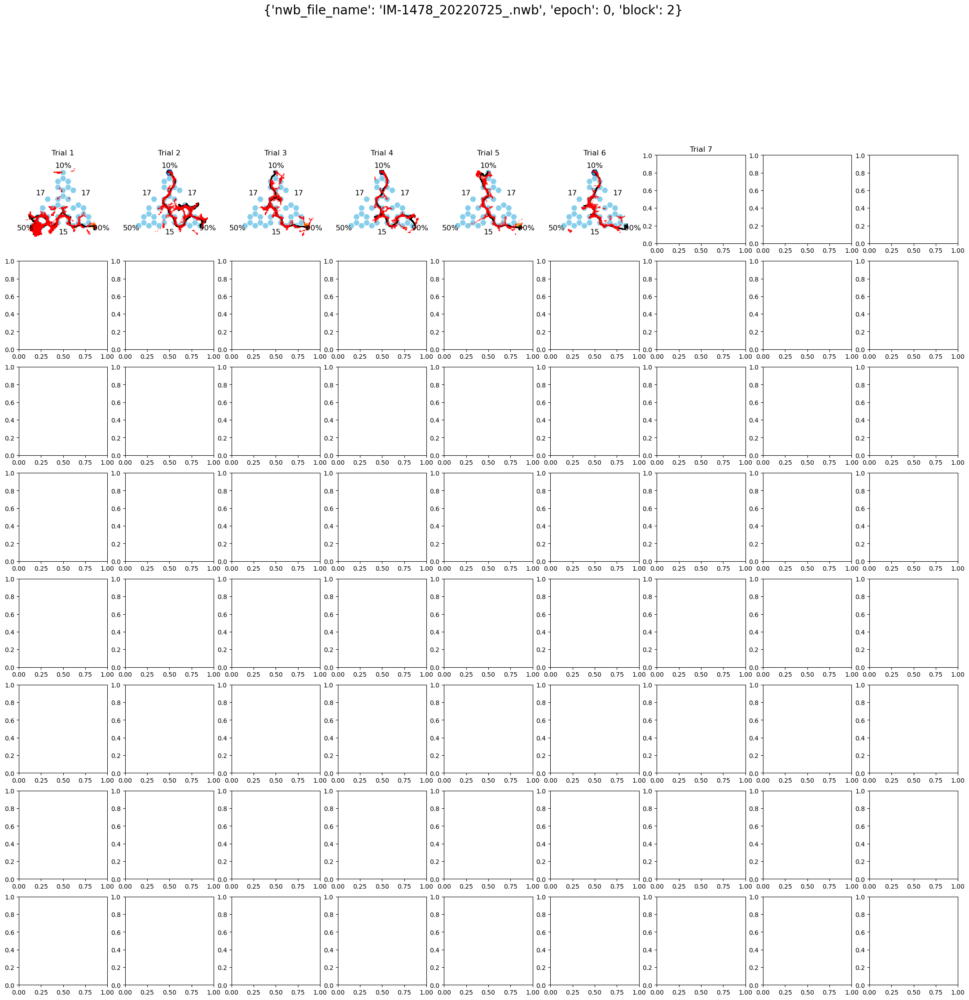

In [24]:
# Only show decoded position if it meets these critera:
spatial_cov_threshold = 500 # 95% decode coverage must be less than this in cm2
speed_threshold = 5 # rat speed must be more than this in cm/s
decode_distance_threshold = 10 # decode distance from rat must be greater than this in cm

# Re-fetch even though we have block_keys so we can order_by
for key in (HexMazeBlock() & block_keys).fetch("KEY", order_by="nwb_file_name, epoch, block"):
    # Get block info
    print(f"{key}: {(sgc.Session() & key).fetch('session_description')[0]}")
    block = HexMazeBlock() & key
    trials = HexMazeBlock.Trial() & key
    num_trials = len(trials)
    maze, p_a, p_b, p_c = block.fetch1("config_id", "p_a", "p_b", "p_c")
    reward_probs = [int(p_a), int(p_b), int(p_c)]
    centroids = HexCentroids().get_core_hex_centroids_dict_cm(key)
    
    # For Frank lab sessions, need DECODE key here... (i should have put epoch as a primary key im sorry ill fix)
    pos_df = (DecodedPositionDistance() & key).fetch1_dataframe()
    
    # Plot port choices
    fig, ax = plot_port_choices(trials.fetch("end_port"), trials.fetch("reward"))
    display(fig)
    plt.close(fig)

    # Set up square-ish grid for trials
    ncols = int(np.ceil(np.sqrt(num_trials)))
    nrows = int(np.ceil(num_trials / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))

    # Make sure axes is 1D so flatten doesn't break
    if isinstance(axes, plt.Axes):
        axes = np.array([axes])
    else:
        axes = np.array(axes).flatten()

    # Big title
    fig.suptitle(f"{key}", fontsize=20, y=1.02)

    # Loop over trials
    for i, trial_info in enumerate(trials):
        # Get trial start/end
        start, end = (sgc.IntervalList() & trial_info).fetch1("valid_times")[0]
        df_trial = pos_df.loc[start:end]
        end_hex = resolve_port(trial_info["end_port"])
        reward = trial_info["reward"]
        
        axes[i].set_title(f"Trial {i+1}")
        # Plot maze with filled port hex if reward, outlined hex if omission
        hex_kwargs = (
        {"highlight_hexes": {end_hex}, "highlight_colors": PORT_COLORS[end_hex]}
        if reward else
        {"outline_hexes": {end_hex}, "outline_colors": PORT_COLORS[end_hex]}
        )
        plot_hex_maze(
            ax=axes[i],
            barriers=maze,
            centroids=centroids,
            snap_centroids=True,
            invert_yaxis=True,
            show_barriers=False,
            show_hex_labels=False,
            show_stats=True,
            reward_probabilities=reward_probs,
            **hex_kwargs,
        )
            
        # Plot position
        axes[i].scatter(df_trial["position_x"], df_trial["position_y"], s=1, color='k')
        # Plot decoded position
        pred = df_trial[
            (df_trial["spatial_cov"] < spatial_cov_threshold) &
            (df_trial["speed"] > speed_threshold) &
            (df_trial["decode_distance"] < decode_distance_threshold)
        ]
        axes[i].scatter(pred["pred_x"], pred["pred_y"], s=1, alpha=0.3, color="red")

    # Hide unused axes
    for j in range(num_trials, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    

In [ ]:
# Check out spatial coverage

plot_spatial_cov = False # takes too long!
if plot_spatial_cov:
    
    for key in decode_keys:
        # Get decoded position df
        df = (DecodedPositionDistance() & key).fetch1_dataframe()

        # What does our spatial coverage look like (smaller is better)
        fig, ax = plt.subplots(figsize=(8, 5))
        ax.hist(df['spatial_cov'], bins=50, alpha=0.85)
        ax.set_xlabel('Spatial coverage of 95% confidence decode region (cm2)')
        ax.set_ylabel('Frequency')
        ax.set_title(f"Histogram of spatial converage ({key['nwb_file_name']})")
        plt.tight_layout()
        plt.show()